Copenhagen Airbnb Insight
Data: https://www.kaggle.com/datasets/dcschmidt/airbnbcopenhagen/data?select=reviews.csv
What we'll try to answer:
1. Is there any correlation between Airbnb daily rate and occupancy?
2. How do different airbnb feature correspond with visitors' experience?
3. Geographic distribution of Airbnb in Copenhagen

Import packages

In [1]:
#Import packages

#Data
import pandas as pd
import numpy as np

#Sentiment Analysis (I ended up using Roberta instead of Vader)
import nltk 
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm

from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

#Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

#For mapping purpose
import geopandas
import folium
import geodatasets
import branca.colormap as cm

First step: Retrieving and Cleaning Data

1A - Retrieving and Selecting Data

In [2]:
#Retrieve data
listings=pd.read_csv(r"C:\Users\Shell\Desktop\Self Upgrade\Python\Portfolio Building\listings.csv.zip")
reviews=pd.read_csv(r"C:\Users\Shell\Desktop\Self Upgrade\Python\Portfolio Building\reviews.csv.zip")

In [3]:
#Review the data briefly
#Check the content and shape
listings.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,6983,https://www.airbnb.com/rooms/6983,20220624204326,2022-06-25,Copenhagen 'N Livin',Lovely apartment located in the hip Nørrebro a...,"Nice bars and cozy cafes just minutes away, ye...",https://a0.muscache.com/pictures/42044170/f63c...,16774,https://www.airbnb.com/users/show/16774,...,4.89,4.72,4.70,NaN,f,1,1,0,0,1.10
1,26057,https://www.airbnb.com/rooms/26057,20220624204326,2022-06-25,Lovely house - most attractive area,Our lovely house in the center of the city is ...,The neighborhood is the most famous one and th...,https://a0.muscache.com/pictures/miso/Hosting-...,109777,https://www.airbnb.com/users/show/109777,...,4.85,4.94,4.81,NaN,f,1,1,0,0,0.56
2,26473,https://www.airbnb.com/rooms/26473,20220624204326,2022-06-25,City Centre Townhouse Sleeps 1-10 persons,GUESTHOUSE ON KNABROSTRÆDE - located in the ab...,NaN,https://a0.muscache.com/pictures/8e132ba0-b68c...,112210,https://www.airbnb.com/users/show/112210,...,4.69,4.88,4.60,NaN,f,11,6,5,0,2.06
3,29118,https://www.airbnb.com/rooms/29118,20220624204326,2022-06-25,Best Location in Cool Istedgade,<b>The space</b><br />The apartment is situate...,NaN,https://a0.muscache.com/pictures/b83c7003-367a...,125230,https://www.airbnb.com/users/show/125230,...,5.00,4.85,4.77,NaN,f,1,1,0,0,0.15
4,670820,https://www.airbnb.com/rooms/670820,20220624204326,2022-06-25,1 Bedroom Apartment 5 min to Centre,The flat is located close to the city center -...,The flat is surrounded by parks and streets th...,https://a0.muscache.com/pictures/91442571/8563...,1566921,https://www.airbnb.com/users/show/1566921,...,4.88,4.88,4.25,NaN,f,1,1,0,0,0.10


In [4]:
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,6983,8985,2009-09-04,31133,Jeff,"Convenient location, clean apartment, great br..."
1,6983,9199,2009-09-07,11472,Andrea,We really enjoyed staying to Simon in our firs...
2,6983,11763,2009-09-28,35317,Jeanine,"Friendly host, save neighbourhood, clean appar..."
3,6983,20616,2009-12-17,53151,Sonja,"Simon is great! Fantastic place to stay, supe..."
4,6983,23168,2010-01-04,50856,James,"Great bed, clean apartment, comfy bed, accomod..."


In [5]:
# I would like to create a new dataframe containing columns that are necessary for my analysis from the two datasets.
# Before that, I will clean each dataset independently as they have different frequency
# 'listings' consist of one data row per listings, while 'reviews' contains multiple
# I'm separating them in case I need to use them on their own in the future

In [6]:
#Check data columns and finding index of columns so I can easily refer them later
pd.set_option('display.max_rows', None)
for idx, col in enumerate(listings.columns):
    print(f"Index: {idx}, Column Name: {col}")
for idx, col in enumerate(reviews.columns):
    print(f"Index: {idx}, Column Name: {col}")


Index: 0, Column Name: id
Index: 1, Column Name: listing_url
Index: 2, Column Name: scrape_id
Index: 3, Column Name: last_scraped
Index: 4, Column Name: name
Index: 5, Column Name: description
Index: 6, Column Name: neighborhood_overview
Index: 7, Column Name: picture_url
Index: 8, Column Name: host_id
Index: 9, Column Name: host_url
Index: 10, Column Name: host_name
Index: 11, Column Name: host_since
Index: 12, Column Name: host_location
Index: 13, Column Name: host_about
Index: 14, Column Name: host_response_time
Index: 15, Column Name: host_response_rate
Index: 16, Column Name: host_acceptance_rate
Index: 17, Column Name: host_is_superhost
Index: 18, Column Name: host_thumbnail_url
Index: 19, Column Name: host_picture_url
Index: 20, Column Name: host_neighbourhood
Index: 21, Column Name: host_listings_count
Index: 22, Column Name: host_total_listings_count
Index: 23, Column Name: host_verifications
Index: 24, Column Name: host_has_profile_pic
Index: 25, Column Name: host_identity_ve

In [7]:
#Create variables containing only necessary data
listings_selected=listings.iloc[:, [0, 4, 11, 14, 17,27, 29,30, 32,39,] + list(range(49, 53)) + list(range(60, 66))]
reviews_selected=reviews.iloc[:,[0,5]]

1B- Cleaning Data

In [8]:
#Starting from 'listings' data
#Check data and point out what should be cleaned (column, index, null, content, type)

In [9]:
listings_selected.head()

,id,name,host_since,host_response_time,host_is_superhost,neighbourhood_cleansed,latitude,longitude,room_type,price,has_availability,availability_30,availability_60,availability_90,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location
0,6983,Copenhagen 'N Livin',2009-05-12,within a day,f,Nrrebro,55.68641,12.54741,Entire home/apt,$877.00,t,0,0,22,4.78,4.78,4.79,4.86,4.89,4.72
1,26057,Lovely house - most attractive area,2010-04-17,within an hour,f,Indre By,55.69307,12.57649,Entire home/apt,"$2,400.00",t,0,3,9,4.91,4.93,4.96,4.92,4.85,4.94
2,26473,City Centre Townhouse Sleeps 1-10 persons,2010-04-22,within an hour,f,Indre By,55.67602,12.57540,Entire home/apt,"$3,350.00",t,3,3,3,4.53,4.62,4.44,4.77,4.69,4.88
3,29118,Best Location in Cool Istedgade,2010-05-15,within a day,f,Vesterbro-Kongens Enghave,55.67023,12.55504,Entire home/apt,$725.00,t,3,3,3,4.91,4.85,4.77,5.00,5.00,4.85
4,670820,1 Bedroom Apartment 5 min to Centre,2012-01-04,NaN,f,Indre By,55.69001,12.57315,Entire home/apt,"$1,116.00",t,0,0,0,4.63,4.38,4.50,4.75,4.88,4.88


In [10]:
listings_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12495 entries, 0 to 12494
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   id                           12495 non-null  int64  
 1   name                         12495 non-null  object 
 2   host_since                   12494 non-null  object 
 3   host_response_time           9658 non-null   object 
 4   host_is_superhost            12494 non-null  object 
 5   neighbourhood_cleansed       12495 non-null  object 
 6   latitude                     12495 non-null  float64
 7   longitude                    12495 non-null  float64
 8   room_type                    12495 non-null  object 
 9   price                        12495 non-null  object 
 10  has_availability             12495 non-null  object 
 11  availability_30              12495 non-null  int64  
 12  availability_60              12495 non-null  int64  
 13  availability_90 

In [11]:
#Identifying unique values in case something need to be standardized
for col in listings_selected.columns:
    print(f"Unique values in '{col}':")
    print(listings_selected[col].unique(), '\n')

Unique values in 'id':
[              6983              26057              26473 ...
            9872599 595224605480025818            4806059] 

Unique values in 'name':
["Copenhagen 'N Livin'" 'Lovely house - most attractive area'
 'City Centre Townhouse Sleeps 1-10 persons' ...
 'Super Juli discount: Nice house, central and calm'
 'Villa, 1936 with private garden near Copenhagen'
 'Cosy and spacious home'] 

Unique values in 'host_since':
['2009-05-12' '2010-04-17' '2010-04-22' ... '2013-11-20' '2010-10-21'
 '2022-04-01'] 

Unique values in 'host_response_time':
['within a day' 'within an hour' nan 'within a few hours'
 'a few days or more'] 

Unique values in 'host_is_superhost':
['f' 't' nan] 

Unique values in 'neighbourhood_cleansed':
['Nrrebro' 'Indre By' 'Vesterbro-Kongens Enghave' 'sterbro'
 'Frederiksberg' 'Amager st' 'Bispebjerg' 'Brnshj-Husum' 'Amager Vest'
 'Valby' 'Vanlse'] 

Unique values in 'latitude':
[55.68641 55.69307 55.67602 ... 55.65762 55.73815 55.73038] 

Uniqu

In [12]:
#After looking at the data, here are a few things I'll need to do

#Column name:change 'id' into 'listing_id' -> so it's the same with 'reviews' dataset columns
#Index: keeping it as it is
#Null: drop rows with null values

#Ideally I will save this as a new dataframe before continuing to modifying the content

In [13]:
listings_c1=listings_selected.dropna().rename(columns={'id':'listing_id'})
listings_c1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7934 entries, 0 to 12494
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   listing_id                   7934 non-null   int64  
 1   name                         7934 non-null   object 
 2   host_since                   7934 non-null   object 
 3   host_response_time           7934 non-null   object 
 4   host_is_superhost            7934 non-null   object 
 5   neighbourhood_cleansed       7934 non-null   object 
 6   latitude                     7934 non-null   float64
 7   longitude                    7934 non-null   float64
 8   room_type                    7934 non-null   object 
 9   price                        7934 non-null   object 
 10  has_availability             7934 non-null   object 
 11  availability_30              7934 non-null   int64  
 12  availability_60              7934 non-null   int64  
 13  availability_90       

In [14]:
#Now that the data have 0 nulls, I continue to an in-depth cleaning process

1C - Feature Engineering 

In [15]:
#Few things to do for each column

#host_since -> make a new column identifying hosting duration. First, use regex to retrieve year data, then substract
#host_response time -> delegate numbers and change data type to category
#host_is_superhost-> delegate numbers and change data type to category
#neighbourhood_cleansed -> delegate numbers and change data type to category
#room_type -> delegate numbers and change data type to category
#price -> clean and change into float
#has_availability-> delegate numbers and change data type to category

In [16]:
#Creating hosting duration data from host_since column
listings_c2=listings_c1
listings_c2['hosting_duration']=2022-listings_c2['host_since'].str.extract(r'(\d{4})').astype('int')

In [17]:
#Change data type to category and delegate numbers for some of the columns mentioned

#define column to numerized
cols_to_numerized=['host_response_time','host_is_superhost','neighbourhood_cleansed','room_type','has_availability']

#change data type and numerized
for col in cols_to_numerized:
    listings_c2[col] = listings_c2[col].astype('category').cat.codes

In [18]:
#Price -> clean and change into float

#Remove dollar sign
listings_c2['price']=listings_c2['price'].replace({'\$': '', ',': ''},regex=True).astype('float')

listings_c2.dtypes

listing_id                       int64
name                            object
host_since                      object
host_response_time                int8
host_is_superhost                 int8
neighbourhood_cleansed            int8
latitude                       float64
longitude                      float64
room_type                         int8
price                          float64
has_availability                  int8
availability_30                  int64
availability_60                  int64
availability_90                  int64
review_scores_rating           float64
review_scores_accuracy         float64
review_scores_cleanliness      float64
review_scores_checkin          float64
review_scores_communication    float64
review_scores_location         float64
hosting_duration                 int64
dtype: object

In [19]:
#Cleaning 'reviews' data
#Check data and point out what should be cleaned (column, index, null, content, type)

In [20]:
reviews_selected.head()

,listing_id,comments
0,6983,"Convenient location, clean apartment, great br..."
1,6983,We really enjoyed staying to Simon in our firs...
2,6983,"Friendly host, save neighbourhood, clean appar..."
3,6983,"Simon is great! Fantastic place to stay, supe..."
4,6983,"Great bed, clean apartment, comfy bed, accomod..."


In [21]:
reviews_selected.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225826 entries, 0 to 225825
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  225826 non-null  int64 
 1   comments    225815 non-null  object
dtypes: int64(1), object(1)
memory usage: 3.4+ MB


In [22]:
#After looking at the data, here are a few things I'll need to do

#Column name:keeping it as it is
#Index: keeping it as it is
#Null: drop rows with null values

In [23]:
reviews_c1=reviews_selected.dropna()
reviews_c1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 225815 entries, 0 to 225825
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  225815 non-null  int64 
 1   comments    225815 non-null  object
dtypes: int64(1), object(1)
memory usage: 5.2+ MB


In [24]:
#Now we're going to do sentiment analysis to the comments using Roberta

In [25]:
#The large data makes the process incredibly slow, so I use GPU to make it faster
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

#However I found that I have too much data for the reviews (200k+), and it is processing really slowly/
#For this exercise, I'll drop duplicates and keep the last value (see down below)

In [26]:
#In order to use Roberta, we need to tokenized the sentences..
#..transform it into PyTorch, and then run it through the model
#However, the model only works for a certain length of words (512 tokens), therefore I'm dropping them to avoid error
tqdm.pandas()
too_long_comments=reviews_c1[reviews_c1['comments'].progress_apply(lambda x: len(tokenizer.tokenize(str(x))) > 512)].index
reviews_c1 = reviews_c1.drop(index=too_long_comments).drop_duplicates(subset='listing_id', keep='last')

  0%|          | 0/225815 [00:00<?, ?it/s]

In [27]:
reviews_c1.head()

,listing_id,comments
170,6983,Simon’s place was lovely and he was great at c...
228,26057,Kari's home was exactly as advertised. We've ...
276,670820,"The place has a very good location, close to N..."
292,444974,we had an amazing time at Henriks place. it is...
308,677453,Staying at Benita's flat was perfect! Finding ...


In [28]:
#after dropping off comments that are too long and duplicates, I continue by running Roberta

In [29]:
#create a def function for Roberta
def polarity_scores_roberta(Example):
    tokenized= tokenizer(Example, return_tensors='pt').to(device) #tokenization
    output=model(**tokenized) #calling the model to read it
    scores=output[0][0].detach().numpy() #convert to array
    scores = softmax(scores) #convert logits into probabilities
    scores_dict = {
        'roberta_neg' : scores[0],
        'roberta_neu' : scores[1],
        'roberta_pos' : scores[2]
    } #create a dictionary to label each sentiment score from the model
    return scores_dict

In [ ]:
#run Roberta in every row of the 'comments' column
roberta_results= {}
for i, row in tqdm(reviews_c1.iterrows(), total=len(reviews_c1)):
    text = row['comments']
    
    roberta_results[i]=polarity_scores_roberta(text)

In [ ]:
#keep the result in a new  dataframe
polarity=pd.DataFrame(roberta_results).T
polarity.head()

In [ ]:
#Join polarity and reviews_c1
reviews_c2=pd.merge(reviews_c1,polarity,how="inner",left_index=True, right_index=True)
#because the iteration takes a long time, I saved the result to CSV so I can bring them instead of rerunning
reviews_c2.to_csv('reviews_c2.csv')

In [33]:
#When I rerun the project, I'm just going to import the saved document to save time
reviews_c2=pd.read_csv(r"C:\Users\Shell\Desktop\Self Upgrade\Python\Portfolio Building\reviews_c2.csv")
reviews_c2.head()

,Unnamed: 0,listing_id,comments,roberta_neg,roberta_neu,roberta_pos
0,170,6983,Simon’s place was lovely and he was great at c...,0.001599,0.007991,0.990410
1,228,26057,Kari's home was exactly as advertised. We've ...,0.001564,0.009132,0.989304
2,276,670820,"The place has a very good location, close to N...",0.027683,0.131668,0.840649
3,292,444974,we had an amazing time at Henriks place. it is...,0.001289,0.006865,0.991847
4,308,677453,Staying at Benita's flat was perfect! Finding ...,0.001383,0.006505,0.992111


In [34]:
#All data has been numerized and are ready for further analysis

Second step: Data Analysis

2A: The correlation between Airbnb daily rate and occupancy 

Text(0, 0.5, 'Occupancy within 90 days')

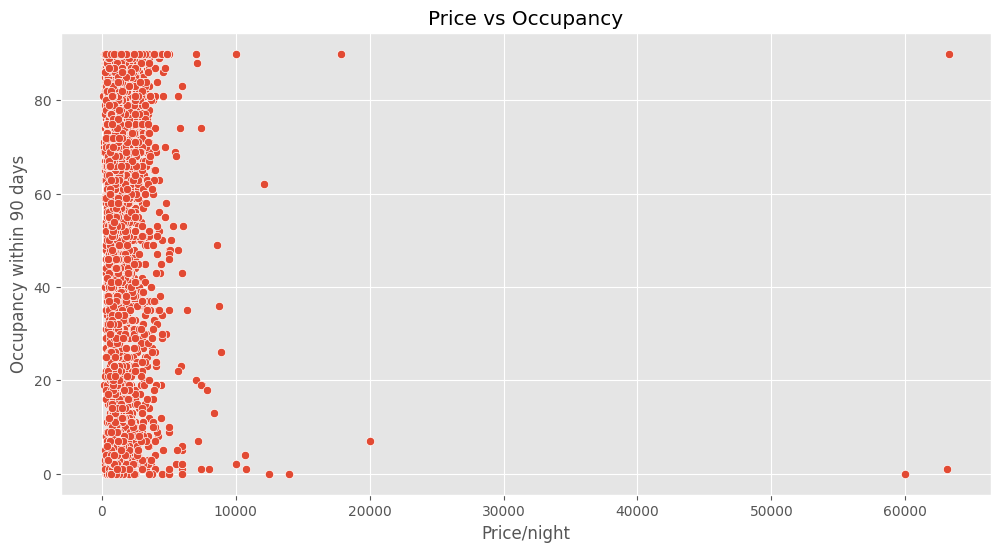

In [35]:
#Airbnb profile: The correlation between price and availability

#I would like to see whether price affects occupancy.
#With our current data, I can find occupancy for the next 90 days by substracting 90 to availability90 data
listings_c2['occupancy_90']=90-listings_c2['availability_90']


#Afterwards we can immediately plot the relationship between price and occupancy
plt.figure(figsize=(12, 6))
sns.scatterplot(x=listings_c2['price'],y=listings_c2['occupancy_90'])
plt.title('Price vs Occupancy')
plt.xlabel('Price/night')
plt.ylabel('Occupancy within 90 days')

Text(0, 0.5, 'Review Score Rating')

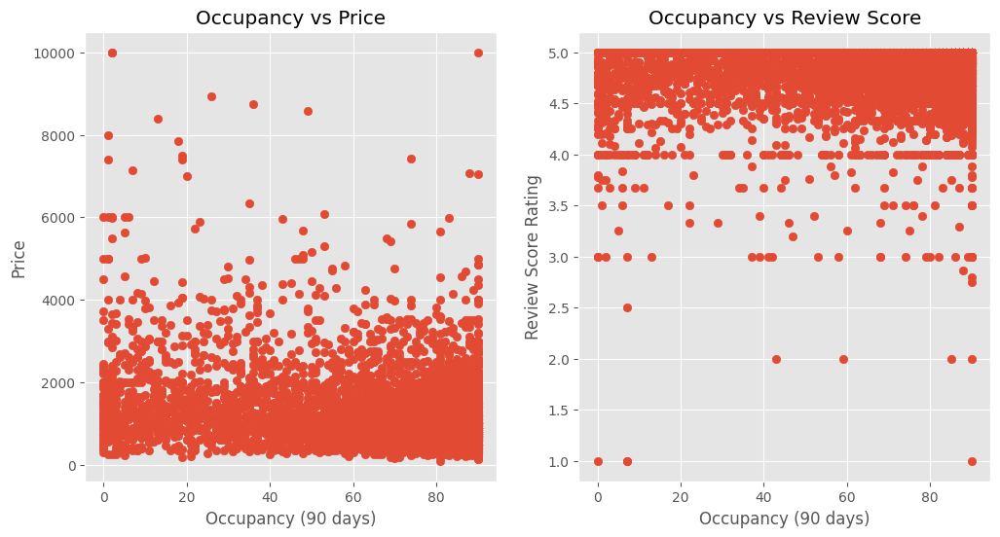

In [36]:
#I will drop rows with housing prices >10000
listings_c3 = listings_c2.drop(listings_c2[listings_c2['price'] > 10000].index)

#Afterwards we can plot the relationship between price and occupancy
plt.figure(figsize=(12, 6))

ax1=plt.subplot2grid((1,2),(0,0))
ax1.scatter(x=listings_c3['occupancy_90'],y=listings_c3['price'])
ax1.set_title('Occupancy vs Price')
ax1.set_xlabel('Occupancy (90 days)')
ax1.set_ylabel('Price')


ax2=plt.subplot2grid((1,2),(0,1))
ax2.scatter(listings_c3['occupancy_90'],listings_c3['review_scores_rating'])
ax2.set_title('Occupancy vs Review Score')
ax2.set_xlabel('Occupancy (90 days)')
ax2.set_ylabel('Review Score Rating')

In [37]:
#It seems that datas are not normally distributed and thus it's difficult to see a correlation result

2B: How do different airbnb feature correspondents with visitors' experience?

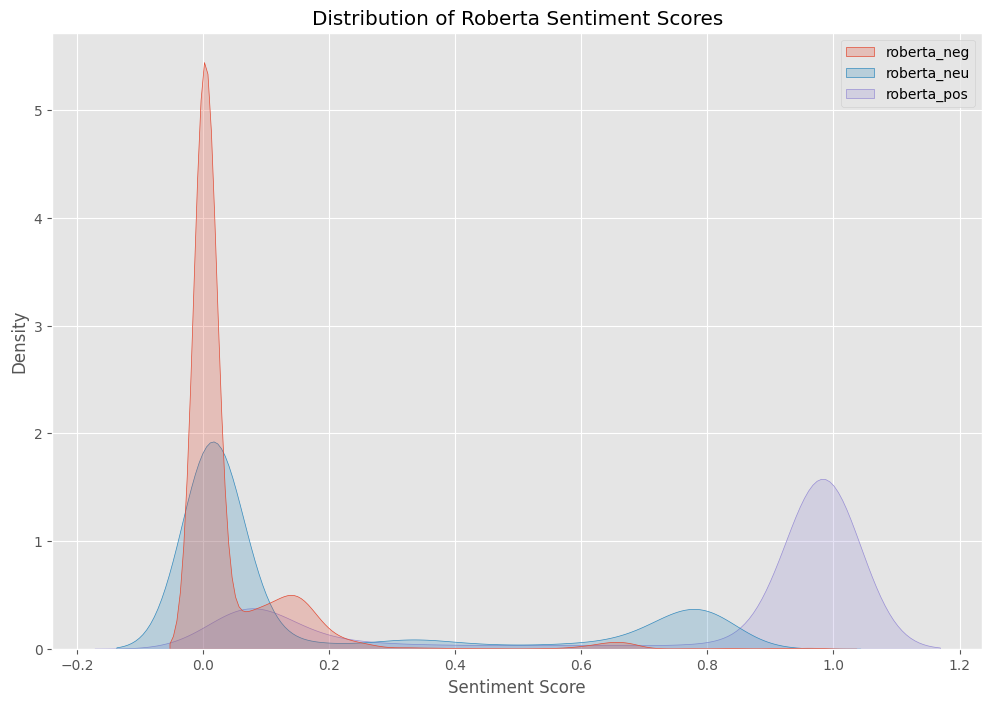

In [38]:
#Reading the Sentiment data
#First I'd like to see the distribution of sentiment
sns.kdeplot(data=reviews_c2[['roberta_neg', 'roberta_neu', 'roberta_pos']], fill=True)
plt.title("Distribution of Roberta Sentiment Scores")
plt.xlabel("Sentiment Score")
plt.ylabel("Density")
plt.show()

In [39]:
#We can see generally people have positive sentiment/experience.

In [40]:
#I want to do correlation analysis, and to make that happen, 
#I'm gonna join the data from listings and reviews
combined=pd.merge(reviews_c2,listings_c3,how="inner",on='listing_id')
combined.head()

,Unnamed: 0,listing_id,comments,roberta_neg,roberta_neu,roberta_pos,name,host_since,host_response_time,host_is_superhost,...,availability_60,availability_90,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,hosting_duration,occupancy_90
0,170,6983,Simon’s place was lovely and he was great at c...,0.001599,0.007991,0.990410,Copenhagen 'N Livin',2009-05-12,1,0,...,0,22,4.78,4.78,4.79,4.86,4.89,4.72,13,68
1,228,26057,Kari's home was exactly as advertised. We've ...,0.001564,0.009132,0.989304,Lovely house - most attractive area,2010-04-17,3,0,...,3,9,4.91,4.93,4.96,4.92,4.85,4.94,12,81
2,292,444974,we had an amazing time at Henriks place. it is...,0.001289,0.006865,0.991847,Penthouse apartment w. roof terrace,2012-04-24,1,0,...,12,12,4.83,4.60,4.60,4.80,5.00,4.80,10,78
3,308,677453,Staying at Benita's flat was perfect! Finding ...,0.001383,0.006505,0.992111,Flat near city lakes in central CPH,2009-03-29,1,0,...,0,0,4.83,4.77,5.00,5.00,5.00,5.00,13,90
4,444,454064,Super lækkert og smuk beliggenhed.,0.154357,0.757664,0.087979,Modern apt. with roof terrace - City apt.,2012-04-30,0,0,...,13,19,4.55,4.72,3.98,4.43,4.45,4.70,10,71


In [41]:
#I'm running correlation on only certain matrix
matrix_corr=['price','roberta_pos','host_response_time','host_is_superhost','neighbourhood_cleansed','room_type','review_scores_rating','hosting_duration','occupancy_90']
combined[matrix_corr].corr(numeric_only=True, method='kendall') #using kendall as the data is not normally distirbuted

,price,roberta_pos,host_response_time,host_is_superhost,neighbourhood_cleansed,room_type,review_scores_rating,hosting_duration,occupancy_90
price,1.000000,0.022645,-0.025551,-0.066331,-0.002292,-0.371574,0.073501,0.013195,-0.173204
roberta_pos,0.022645,1.000000,-0.015194,0.001540,0.032758,-0.012961,0.140420,0.046775,0.020928
host_response_time,-0.025551,-0.015194,1.000000,0.121982,-0.042550,0.076184,-0.036863,-0.083272,0.047136
host_is_superhost,-0.066331,0.001540,0.121982,1.000000,-0.034114,0.148020,0.007980,0.025134,0.018939
neighbourhood_cleansed,-0.002292,0.032758,-0.042550,-0.034114,1.000000,-0.035689,0.021624,0.032304,0.016595
room_type,-0.371574,-0.012961,0.076184,0.148020,-0.035689,1.000000,-0.071886,0.006275,-0.068668
review_scores_rating,0.073501,0.140420,-0.036863,0.007980,0.021624,-0.071886,1.000000,0.022349,0.068489
hosting_duration,0.013195,0.046775,-0.083272,0.025134,0.032304,0.006275,0.022349,1.000000,0.067789
occupancy_90,-0.173204,0.020928,0.047136,0.018939,0.016595,-0.068668,0.068489,0.067789,1.000000


<Axes: >

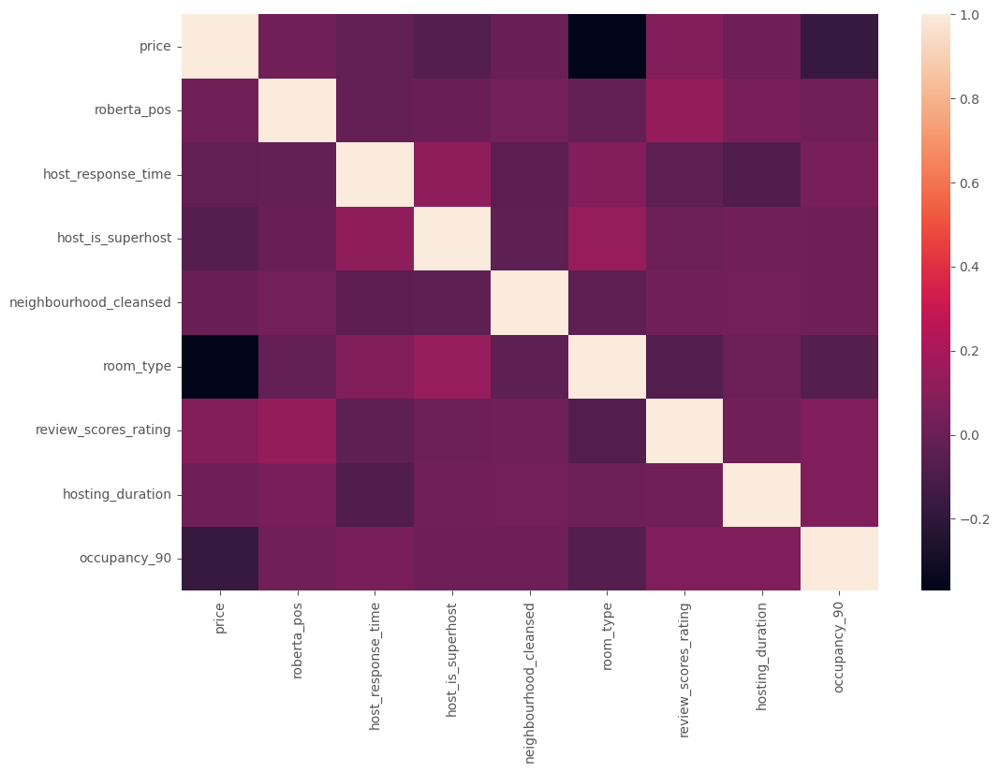

In [42]:
sns.heatmap(combined[matrix_corr].corr(numeric_only=True, method='kendall'))

In [43]:
#Sorting the correlation so I can get a big picture on the correlation.
sorted=combined[matrix_corr].corr(numeric_only=True,method='kendall').unstack().sort_values()
sorted

price                   room_type                -0.371574
room_type               price                    -0.371574
price                   occupancy_90             -0.173204
occupancy_90            price                    -0.173204
hosting_duration        host_response_time       -0.083272
host_response_time      hosting_duration         -0.083272
room_type               review_scores_rating     -0.071886
review_scores_rating    room_type                -0.071886
room_type               occupancy_90             -0.068668
occupancy_90            room_type                -0.068668
host_is_superhost       price                    -0.066331
price                   host_is_superhost        -0.066331
neighbourhood_cleansed  host_response_time       -0.042550
host_response_time      neighbourhood_cleansed   -0.042550
                        review_scores_rating     -0.036863
review_scores_rating    host_response_time       -0.036863
room_type               neighbourhood_cleansed   -0.0356

In [44]:
#There is no significant correlation found between the data 

2C:Geographic distribution of Airbnb in Copenhagen

In [78]:
#I use the modified 'listings' dataframe instead of the 'combined' one
listings_c2.columns

Index(['listing_id', 'name', 'host_since', 'host_response_time',
       'host_is_superhost', 'neighbourhood_cleansed', 'latitude', 'longitude',
       'room_type', 'price', 'has_availability', 'availability_30',
       'availability_60', 'availability_90', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'hosting_duration', 'occupancy_90'],
      dtype='object')

In [79]:
#Create a new dataframe for mapping
Geography=listings_c2.loc[:,('name','latitude','longitude','price','review_scores_rating')]
Geography.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7934 entries, 0 to 12494
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   name                  7934 non-null   object 
 1   latitude              7934 non-null   float64
 2   longitude             7934 non-null   float64
 3   price                 7934 non-null   float64
 4   review_scores_rating  7934 non-null   float64
dtypes: float64(4), object(1)
memory usage: 629.9+ KB


In [84]:
#Checking and dropping duplicates
Geography=Geography.drop_duplicates(subset=['name'], keep='last')
Geography.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7719 entries, 0 to 12494
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   name                  7719 non-null   object 
 1   latitude              7719 non-null   float64
 2   longitude             7719 non-null   float64
 3   price                 7719 non-null   float64
 4   review_scores_rating  7719 non-null   float64
dtypes: float64(4), object(1)
memory usage: 361.8+ KB


In [85]:
#Create point geometries
geometry = geopandas.points_from_xy(Geography.longitude, Geography.latitude)
geo_df = geopandas.GeoDataFrame(Geography[['name','latitude','longitude','price','review_scores_rating']],
                                geometry=geometry)
geo_df.head()

,name,latitude,longitude,price,review_scores_rating,geometry
0,Copenhagen 'N Livin',55.686410,12.547410,877.0,4.78,POINT (12.54741 55.68641)
1,Lovely house - most attractive area,55.693070,12.576490,2400.0,4.91,POINT (12.57649 55.69307)
2,City Centre Townhouse Sleeps 1-10 persons,55.676020,12.575400,3350.0,4.53,POINT (12.5754 55.67602)
3,Best Location in Cool Istedgade,55.670230,12.555040,725.0,4.91,POINT (12.55504 55.67023)
5,"165 m2 artist flat on Vesterbro, with 2 bathr...",55.672638,12.552493,1153.0,4.90,POINT (12.55249 55.67264)


In [86]:
#importing base map (global level)
world = geopandas.read_file(geodatasets.get_path("naturalearth.land"))

(55.6, 55.75)

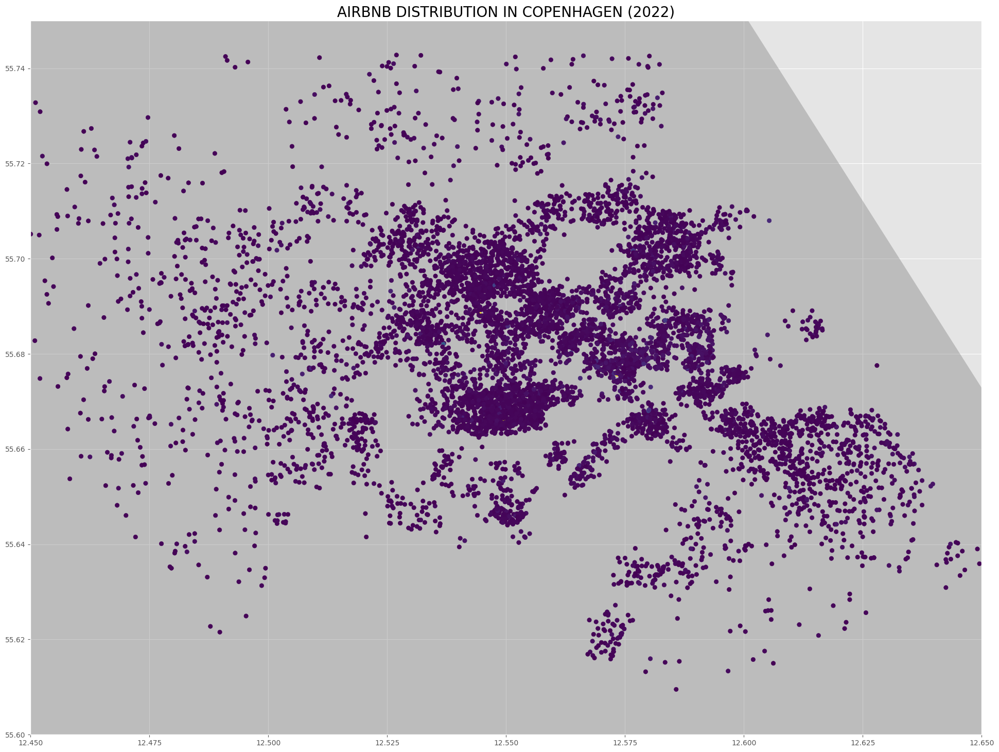

In [87]:
#Setting plot
fig, ax = plt.subplots(figsize=(24, 18))
world.plot(ax=ax, alpha=0.4, color="grey")
geo_df.plot(column='price', ax=ax)
plt.title("AIRBNB DISTRIBUTION IN COPENHAGEN (2022)",
          fontsize=20, 
          color='black')

#Zoom in
ax.set_xlim(12.45, 12.65)
ax.set_ylim(55.60, 55.75)  

In [99]:
#I feel like the previous example is not informative
#Thus I'm making a new visualization with folium where we can click the dots and see more information

map=folium.Map(location=[55.68641, 12.54741], titles="Airbnb Location in Copenhagen", zoom_start=12)

#function for rating color
def rating_color(rating):
    if rating >= 4.5:
        return 'green'
    elif rating >= 3:
        return 'orange'
    else:
        return 'red'

for _, row in geo_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=max(0.1, min(row['price'] / 50, 0.5)),
        color=rating_color(row['review_scores_rating'] or 0),
        fill=True,
        fill_opacity=0.2,
        popup=folium.Popup(f"{row['name']}<br>Price:${row['price']}<br>Rating: {row['review_scores_rating']}", max_width=250)
    ).add_to(map)


AIRBNB DISTRIBUTION IN COPENHAGEN (2022)
The different colour of dots represent average ratings given to each listing. 
With a scale of 0 to 5, green indicates ratings above 4.5, orange above 3, and the rest are colored red.
An attempt was made to differentiate the sizes of the dots according to daily rate, however as they fall into similar price ranges, it can hardly be visually represented.

In [100]:
map
#Unfortunately I haven't got into the part on how to add title and legend to the folium map 
#For the time being I'm doing it manually by downloading the map first and do the layouting somewhere else :)

The map suggests a few thing:
1. Airbnbs are distributed throughout the municipality, and there appears to be a high concentration across the area.
2. Beyond the municipality boundary, Airbnb locations become more dispersed.

In [101]:
map.save('Copenhagen_Airbnb_Distribution.html')